<a href="https://colab.research.google.com/github/AlexVonSchwerdtner/BA780-Team6/blob/main/Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%html
<marquee style='width: 30%; color: blue;'><b>Welcome to Boston Crime Scene Analytics!</b></marquee>

# *BA780 - Team 6*
## Team Project - Exploratory Data Analysis

*Keshuo Liu, Subhiksha Sivasubramanian, Zijing Wang, Weiyang Bao, Alex von Schwerdtner*

<img src="https://github.com/AlexVonSchwerdtner/BA780-Team6/blob/859eda2c400da728f46d9d541d23fb19c57805e3/Analyze%20Boston.png?raw=true" width="600" align="center"/>

*Image from [Analyze Boston](https://medium.com/news-stories-from-boston-open-data/official-launch-of-analyze-boston-coming-april-6th-b7513fd58aae)

---
# **Boston Crime Scene Analytics**
---

### *Executive Summary*
Boston’s Crime Scene analysis has shown insightful trends over the past couple of years. In this report years from 2016 to date are analysed. The following analysis on the Boston Crime Scene Data is highly relevant for the Boston Police Department and for any civilian residing or visiting the city of Boston. For example the total number in criminal cases has had a drastic drop in 2020, potentially from the impact of the Covid-19 Pandemic.  The analysis includes the exploration of crimes by year, season, holiday, hour and weekday, offense type, street, an interactive heatmap and interactive maps that include the locations of crimes.

### *Problem definition:*

As current students living in the Boston Area we are interested in analyzing the Boston Crime Scene. We would like to analyze and discover what types of crimes are most common, where the different types of crimes are most likely to occur, and if the frequency of crimes change over specific time spans (e.g. day, week & year). Our mission is to answer questions like “where a person is most likely to be a victim of a crime at a certain time of day, specific months or seasons of a given year?”

## **Data**
*Crime Incident Reports (2016 - 10/04/2021)*

The Data was downloaded from [Analyze Boston](https://data.boston.gov/dataset/crime-incident-reports-august-2015-to-date-source-new-system)

>*Crime incident reports are provided by Boston Police Department (BPD) to document the initial details surrounding an incident to which BPD officers respond. This is a dataset containing records from the new crime incident report system, which includes a reduced set of fields focused on capturing the type of incident as well as when and where it occurred. Records in the new system begin in June of 2015.*

Each row represents a specific crime report, including: the type of crime, date and time, and location.

* **INCIDENT_NUMBER**: Unique incident number for a specific crime report
* **OFFENSE_CODE**: Offense code of the incident (integer)
* **OFFENSE_CODE_GROUP**: Group of offense
* **OFFENSE_DESCRIPTION**: Description of the offense
* **DISTRICT**: Reporting district in Boston
* **REPORTING_AREA**: Reporting Area (integer)
* **SHOOTING**: Whether a shooting occured or not (1,0)
* **OCCURRED_ON_DATE**: Date of incident (TIMESTAMP)
* **YEAR**: Year of incident (integer)
* **MONTH**: Month of incident (integer)
* **DAY_OF_WEEK**: Day of the week of incident
* **HOUR**: Hour of incident (integer)
* **UCR_PART**: Uniform Crime Code Parts (Part One, Part Two, Part Three)
* **STREET**: Street name of incident
* **LAT**: Latitude of the incident (float)
* **LONG**: Longitude of the incident (float)
* **LOCATION**: Combined latitude and longitude of the incident

*We will be using Matplotlib, Seaborn, Plotly, Folium library, Ipywidgets, and Missingno to plot and analyze the data.*

### **Year of 2019** (incomplete DATA)
Because Boston Police Department reported that data for 2019 only starts from September due to change of database system used, yearly, monthly and seasonal analysis in this project will generally exclude 2019 unless specified. 

---
## **Basic information of Datasets used**:

*Crime Dataset*
* 444,145 rows
* There are 17 columns

*Holiday Dataset*
* 342 rows
* There are 6 columns with
* No missing values in this dataset
* Some rows have same date with different holidays






## Content
---

1.  **Setup**
2.  **Data Cleaning & Data Pre-Processing**
3.  **Exploration**
*   *By Year*
*   *By Season*
*   *By Holiday*
*   *By Hour and Weekday*
*   *By Offense Type*
*   *By Street*
*   *By District*
*   *Shooting Cases*
*   *Map*
*   *Heat Map*
4.   **Machine Learning**
5.   **Findings**
6.   **Further Analysis**
---


### *Preview of Cleaned and Pre-Processed Data*

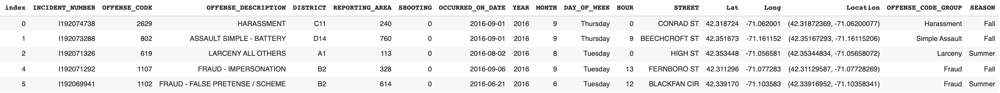

# **1. Setup**

## *Importing Required Packages*

In [2]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster
from ipywidgets import widgets, interactive
import missingno as msno

In [3]:
# displaying all columns and 6 rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',6)

## *Reading all files to the environment from GoogleCloudStorage Bucket*

In [4]:

# Accessing files from the Google Cloud Storage Bucket
from google.cloud import storage
from google.colab import auth
auth.authenticate_user()

In [5]:
# Reading files to the environment from the Google Cloud Storage Bucket
def download_blob(file_name):
    """Downloads a blob from the bucket."""
    project_id = 'ba-780-team6-a1'
    bucket_name = 'ba780-team6-a1'

    storage_client = storage.Client(project_id)

    bucket = storage_client.bucket(bucket_name)
    blob = bucket.blob(file_name)
    blob.download_to_filename(file_name)

    print(
        "Blob {} downloaded to {}.".format(
            file_name, file_name
        )
    )
download_blob('crime-incident-reports-2016.csv')
download_blob('crime-incident-reports-2017.csv')
download_blob('crime-incident-reports-2018.csv')
download_blob('crime-incident-reports-2019.csv')
download_blob('crime-incident-reports-2020.csv')
download_blob('crime-incident-reports-2021.csv')
download_blob('US Holiday Dates (2004-2021).csv')

Blob crime-incident-reports-2016.csv downloaded to crime-incident-reports-2016.csv.
Blob crime-incident-reports-2017.csv downloaded to crime-incident-reports-2017.csv.
Blob crime-incident-reports-2018.csv downloaded to crime-incident-reports-2018.csv.
Blob crime-incident-reports-2019.csv downloaded to crime-incident-reports-2019.csv.
Blob crime-incident-reports-2020.csv downloaded to crime-incident-reports-2020.csv.
Blob crime-incident-reports-2021.csv downloaded to crime-incident-reports-2021.csv.
Blob US Holiday Dates (2004-2021).csv downloaded to US Holiday Dates (2004-2021).csv.


## *Loading Data to variables*

In [6]:
# Reading the crime data sets to the environement
crimes2016 = pd.read_csv('crime-incident-reports-2016.csv')
crimes2017 = pd.read_csv('crime-incident-reports-2017.csv')
crimes2018 = pd.read_csv('crime-incident-reports-2018.csv')
crimes2019 = pd.read_csv('crime-incident-reports-2019.csv')
crimes2020 = pd.read_csv('crime-incident-reports-2020.csv')
crimes2021 = pd.read_csv('crime-incident-reports-2021.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [7]:
# reading the US holidays to the environment
holidays = pd.read_csv('US Holiday Dates (2004-2021).csv')

## *Concatenating all crime datasets (Years 2016 - 2021)*

In [8]:
# concatenating all crime datasets (excluded crimes2015)
frames = [crimes2016,crimes2017,crimes2018,crimes2019,crimes2020,crimes2021]
Crimes_all_years = pd.concat(frames)
Crimes_all_years.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 444145 entries, 0 to 53812
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      444145 non-null  object 
 1   OFFENSE_CODE         444145 non-null  int64  
 2   OFFENSE_CODE_GROUP   299656 non-null  object 
 3   OFFENSE_DESCRIPTION  444145 non-null  object 
 4   DISTRICT             441147 non-null  object 
 5   REPORTING_AREA       444145 non-null  object 
 6   SHOOTING             145693 non-null  object 
 7   OCCURRED_ON_DATE     444145 non-null  object 
 8   YEAR                 444145 non-null  int64  
 9   MONTH                444145 non-null  int64  
 10  DAY_OF_WEEK          444145 non-null  object 
 11  HOUR                 444145 non-null  int64  
 12  UCR_PART             299561 non-null  object 
 13  STREET               433531 non-null  object 
 14  Lat                  423743 non-null  float64
 15  Long              

In [9]:
# EXPORT TO CSV
Crimes_all_years.to_csv('crimes_all_years.csv')

# **2. Data Cleaning & Pre-Processing**

## *Cleaning*

**Explanation of Cleaning Process**


1.   Duplicated crime cases with the same INCIDENT_NUMBER have been dropped and keeping only the first row.
2.   Missing values of the OFFENSE_CODE_GROUP have been filled with existing values for the same OFFENSE_CODE or with the first category in OFFENSE_DESCRIPTION if no applicable historical data is present.
3.   Use 1/0 to indicate shooting cases in SHOOTING conlumn.
5.   Drop rows with no values in STREET and DISTRICT column.
6.   Checking (0,0) location values for latitude and longitude. Due to its presence those values have been excluded from the actual dataframe for creating a mark cluster map. A new dataframe called 'df1' has been created for map marking purposes.





In [10]:
# checking for duplicates
print(len(Crimes_all_years))
print(len(Crimes_all_years.drop_duplicates(subset='INCIDENT_NUMBER', keep='first')))

444145
408703


In [11]:
# dropping duplicates
Crimes_all_years = Crimes_all_years.drop_duplicates(subset='INCIDENT_NUMBER', keep='first').reset_index()
print(len(Crimes_all_years))

408703


In [12]:
NA = Crimes_all_years.isna().sum().sort_values(ascending=False)
NA[NA!=0]

SHOOTING              263642
UCR_PART              144559
OFFENSE_CODE_GROUP    144489
                       ...  
Long                   17482
STREET                  9083
DISTRICT                2812
Length: 7, dtype: int64

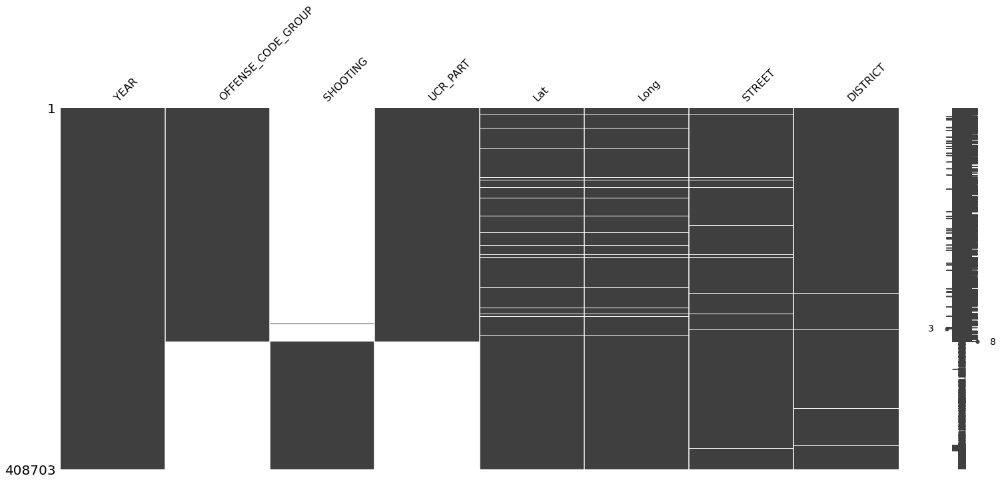

In [13]:
msno.matrix(Crimes_all_years[['YEAR','OFFENSE_CODE_GROUP','SHOOTING','UCR_PART','Lat','Long','STREET','DISTRICT']]);



1.   Due to the dataset system change, data since 2019 has no OFFENSE_CODE_GROUP value. 
    * Solution: fill with historial data with the same OFFENSE_CODE and use the first category in OFFENSE_DESCRIPTION for the remains.
2.   Also because of the system change, SHOOTING changed from Y for "Yes" VS NA for "No", to 1 for "Yes" VS 0 for "No". 
    * Solution: use 1/0 consistently.
3.   UCR_PART is not recorded since 2019. 
    * Solution: because UCR_PART is not used for analysis, this column can be dropped.
4.   There are some STREET and DISTRICT values missing. 
    * Solution: because there's no appropriate reference of these incidents, the row of missing values in STREET and DISTRICT will be excluded.


In [14]:
# filling the NA's in the 'OFFENSE_CODE_GROUP' with non-na 'OFFENSE_CODE_GROUP' of the same 'OFFENSE_CODE' previously used, 
# or replace with the first category in 'OFFENSE_DESCRIPTION' if no applicable historical data
def form(a):
    return a.title()
Crimes_all_years.loc[Crimes_all_years['OFFENSE_CODE_GROUP'].isna()==False,'OFFENSE_CODE_GROUP']=Crimes_all_years.loc[Crimes_all_years['OFFENSE_CODE_GROUP'].isna()==False,'OFFENSE_CODE_GROUP'].apply(form)
OFFENSE_CODE = Crimes_all_years[Crimes_all_years.OFFENSE_CODE_GROUP.isna()==False]
OFFENSE_CODE = OFFENSE_CODE.drop_duplicates(subset='OFFENSE_CODE', keep='first').reset_index()
OFFENSE_CODE = OFFENSE_CODE[['OFFENSE_CODE','OFFENSE_CODE_GROUP']]
Crimes_all_years = Crimes_all_years.merge(OFFENSE_CODE,on='OFFENSE_CODE',how='left')
Crimes_all_years['OFFENSE_CODE_GROUP']=Crimes_all_years.OFFENSE_CODE_GROUP_y
Crimes_all_years = Crimes_all_years.drop(columns=['OFFENSE_CODE_GROUP_x','OFFENSE_CODE_GROUP_y'])
def fill(a):
    if a.find('Sick Assist') != -1:
        return 'Medical Assitance'
    else:
        return a[:(a.find(' - '))]
Crimes_all_years.loc[Crimes_all_years.OFFENSE_CODE_GROUP.isna()==True,'OFFENSE_CODE_GROUP'] = Crimes_all_years[Crimes_all_years.OFFENSE_CODE_GROUP.isna()==True].OFFENSE_DESCRIPTION.apply(fill)
print(len(Crimes_all_years))

408703


In [15]:
Crimes_all_years.SHOOTING.unique()

array([nan, 'Y', 0, 1], dtype=object)

In [16]:
# Only using 1/0 to indicate shooting case or not
Crimes_all_years.loc[Crimes_all_years.SHOOTING.isna(),'SHOOTING'] = 0
Crimes_all_years.loc[Crimes_all_years.SHOOTING=='Y','SHOOTING'] = 1
Crimes_all_years.SHOOTING.unique()

array([0, 1], dtype=object)

In [17]:
# drop UCR_PART column
Crimes_all_years=Crimes_all_years.drop(labels='UCR_PART',axis=1)

In [18]:
# exclude rows that has no values in STREET and DISTRICT column
Crimes_all_years = Crimes_all_years.loc[Crimes_all_years.STREET.isna()==False]
Crimes_all_years = Crimes_all_years.loc[Crimes_all_years.DISTRICT.isna()==False]

In [19]:
# checking other missing values
NA = Crimes_all_years.isna().sum().sort_values(ascending=False)
NA[NA!=0]

Long    10570
Lat     10570
dtype: int64



*   Because Lat and Long are only used in the map plotting section below, the missing value rows will be excluded before mapping.



In [20]:
# missing values in Lat column
Crimes_all_years[Crimes_all_years['Lat'].isnull()]

,index,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long,Location,OFFENSE_CODE_GROUP
21,25,I192029756,3201,PROPERTY - LOST,B2,,0,2016-04-23 11:24:00,2016,4,Saturday,11,RUGGLES ST,NaN,NaN,"(0.00000000, 0.00000000)",Property Lost
70,75,I182056106,1102,FRAUD - FALSE PRETENSE / SCHEME,D14,,0,2016-04-24 01:20:00,2016,4,Sunday,1,CAMBRIDGE ST,NaN,NaN,"(0.00000000, 0.00000000)",Fraud
105,112,I182008257,614,LARCENY THEFT FROM MV - NON-ACCESSORY,C11,,0,2016-12-22 04:15:00,2016,12,Thursday,4,DORCHESTER AVE,NaN,NaN,"(0.00000000, 0.00000000)",Larceny From Motor Vehicle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264132,98655,I172107333,724,AUTO THEFT,A1,,0,2018-01-11 00:50:00,2018,1,Thursday,0,BOYLSTON ST,NaN,NaN,"(0.00000000, 0.00000000)",Auto Theft
264181,98781,I172022524,3125,WARRANT ARREST,A1,171,0,2018-12-21 02:15:00,2018,12,Friday,2,BOYLSTON ST,NaN,NaN,"(0.00000000, 0.00000000)",Warrant Arrests
264211,98873,I110611058-00,3125,WARRANT ARREST,A1,,0,2018-08-29 17:00:00,2018,8,Wednesday,17,CAMBRIDGE ST,NaN,NaN,"(0.00000000, 0.00000000)",Warrant Arrests


In [21]:
# missing values in Long column
Crimes_all_years[Crimes_all_years['Long'].isnull()]

,index,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long,Location,OFFENSE_CODE_GROUP
21,25,I192029756,3201,PROPERTY - LOST,B2,,0,2016-04-23 11:24:00,2016,4,Saturday,11,RUGGLES ST,NaN,NaN,"(0.00000000, 0.00000000)",Property Lost
70,75,I182056106,1102,FRAUD - FALSE PRETENSE / SCHEME,D14,,0,2016-04-24 01:20:00,2016,4,Sunday,1,CAMBRIDGE ST,NaN,NaN,"(0.00000000, 0.00000000)",Fraud
105,112,I182008257,614,LARCENY THEFT FROM MV - NON-ACCESSORY,C11,,0,2016-12-22 04:15:00,2016,12,Thursday,4,DORCHESTER AVE,NaN,NaN,"(0.00000000, 0.00000000)",Larceny From Motor Vehicle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264132,98655,I172107333,724,AUTO THEFT,A1,,0,2018-01-11 00:50:00,2018,1,Thursday,0,BOYLSTON ST,NaN,NaN,"(0.00000000, 0.00000000)",Auto Theft
264181,98781,I172022524,3125,WARRANT ARREST,A1,171,0,2018-12-21 02:15:00,2018,12,Friday,2,BOYLSTON ST,NaN,NaN,"(0.00000000, 0.00000000)",Warrant Arrests
264211,98873,I110611058-00,3125,WARRANT ARREST,A1,,0,2018-08-29 17:00:00,2018,8,Wednesday,17,CAMBRIDGE ST,NaN,NaN,"(0.00000000, 0.00000000)",Warrant Arrests


In [22]:
# missing values in DISTRICT column
Crimes_all_years[Crimes_all_years['DISTRICT'].isnull()]

,index,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long,Location,OFFENSE_CODE_GROUP


In [23]:
Crimes_all_years.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 397708 entries, 0 to 408702
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   index                397708 non-null  int64  
 1   INCIDENT_NUMBER      397708 non-null  object 
 2   OFFENSE_CODE         397708 non-null  int64  
 3   OFFENSE_DESCRIPTION  397708 non-null  object 
 4   DISTRICT             397708 non-null  object 
 5   REPORTING_AREA       397708 non-null  object 
 6   SHOOTING             397708 non-null  object 
 7   OCCURRED_ON_DATE     397708 non-null  object 
 8   YEAR                 397708 non-null  int64  
 9   MONTH                397708 non-null  int64  
 10  DAY_OF_WEEK          397708 non-null  object 
 11  HOUR                 397708 non-null  int64  
 12  STREET               397708 non-null  object 
 13  Lat                  387138 non-null  float64
 14  Long                 387138 non-null  float64
 15  Location         

## *Data Pre-Processing*

**Explanation of Data Pre-Processing Steps**
1.   SEASON column has been added based on the MONTH of each criminal case.
2.   OCCURRED_ON_DATE column has been transformed from string to timestamp.date.
3.   Holiday column has been added by using the merge() function 

In [24]:
# adding SEASON column
Crimes_all_years['SEASON']=None
Crimes_all_years.loc[Crimes_all_years['MONTH'].isin([3,4,5]),'SEASON']='Spring'
Crimes_all_years.loc[Crimes_all_years['MONTH'].isin([6,7,8]),'SEASON']='Summer'
Crimes_all_years.loc[Crimes_all_years['MONTH'].isin([9,10,11]),'SEASON']='Fall'
Crimes_all_years.loc[Crimes_all_years['MONTH'].isin([12,1,2]),'SEASON']='Winter'

In [25]:
# transforming OCCURRED_ON_DATE from str to timestemp.date
def date(time):
    return time.date()

Crimes_all_years['OCCURRED_ON_DATE']=pd.to_datetime(Crimes_all_years['OCCURRED_ON_DATE'],format='%Y-%m-%d %H:%M:%S')
Crimes_all_years['OCCURRED_ON_DATE']=Crimes_all_years['OCCURRED_ON_DATE'].apply(date)

In [26]:
Crimes_all_years.head()

,index,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long,Location,OFFENSE_CODE_GROUP,SEASON
0,0,I192074738,2629,HARASSMENT,C11,240,0,2016-09-01,2016,9,Thursday,0,CONRAD ST,42.318724,-71.062001,"(42.31872369, -71.06200077)",Harassment,Fall
1,1,I192073288,802,ASSAULT SIMPLE - BATTERY,D14,760,0,2016-09-01,2016,9,Thursday,9,BEECHCROFT ST,42.351673,-71.161152,"(42.35167293, -71.16115206)",Simple Assault,Fall
2,2,I192071326,619,LARCENY ALL OTHERS,A1,113,0,2016-08-02,2016,8,Tuesday,0,HIGH ST,42.353448,-71.056581,"(42.35344834, -71.05658072)",Larceny,Summer
3,4,I192071292,1107,FRAUD - IMPERSONATION,B2,328,0,2016-09-06,2016,9,Tuesday,13,FERNBORO ST,42.311296,-71.077283,"(42.31129587, -71.07728269)",Fraud,Fall
4,5,I192069941,1102,FRAUD - FALSE PRETENSE / SCHEME,B2,614,0,2016-06-21,2016,6,Tuesday,12,BLACKFAN CIR,42.339170,-71.103583,"(42.33916952, -71.10358341)",Fraud,Summer


In [27]:
# adding Holiday columns (showing the name of holiday if exists, otherwise missing value)
holidays.loc[(holidays.Holiday=='Labor Day Weekend') & (holidays.WeekDay=='Saturday'),'Holiday']='Labor Day Weekend Sat'
holidays.loc[(holidays.Holiday=='Labor Day Weekend') & (holidays.WeekDay=='Sunday'),'Holiday']='Labor Day Weekend Sun'
holidays = holidays[['Date','Holiday']]
holidays['Date'] = pd.to_datetime(holidays['Date'],format='%Y-%m-%d')
holidays['Date'] = holidays['Date'].apply(date)
crimes_holidays = Crimes_all_years.merge(holidays, left_on='OCCURRED_ON_DATE',right_on='Date',how='left')

In [28]:
Crimes_all_years.to_csv("Crimes2.csv")

In [29]:
# result with holiday information is saved and used later on individually 
# because there're duplicated incident numbers after merging resulting from having two holidays on the same day
len(crimes_holidays.INCIDENT_NUMBER)

397931

# **3. Exploration**

## General Overview of Top Boston Criminal Cases

In [30]:
# top-5 frequent criminal report types
dftop6 = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby('OFFENSE_CODE_GROUP').size().to_frame('count').sort_values(by='count', ascending=False).head(6).reset_index()
dftop6 = dftop6.drop([5])
dftop6

,OFFENSE_CODE_GROUP,count
0,Motor Vehicle Accident Response,46829
1,Larceny,32230
2,Medical Assistance,28819
3,Investigate Person,27096
4,Vandalism,18669


In [31]:
# number of crimes over offense groups by year

df = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['OFFENSE_CODE_GROUP','YEAR'])['INCIDENT_NUMBER'].count().reset_index()
df = df.sort_values(by=['YEAR','INCIDENT_NUMBER'], ascending=False)
df = df[df['OFFENSE_CODE_GROUP'].isin(dftop6.OFFENSE_CODE_GROUP)]

df[df.YEAR==2021]

,OFFENSE_CODE_GROUP,YEAR,INCIDENT_NUMBER
196,Motor Vehicle Accident Response,2021,7409
137,Investigate Person,2021,4928
154,Larceny,2021,4408
298,Vandalism,2021,2555
181,Medical Assistance,2021,2522


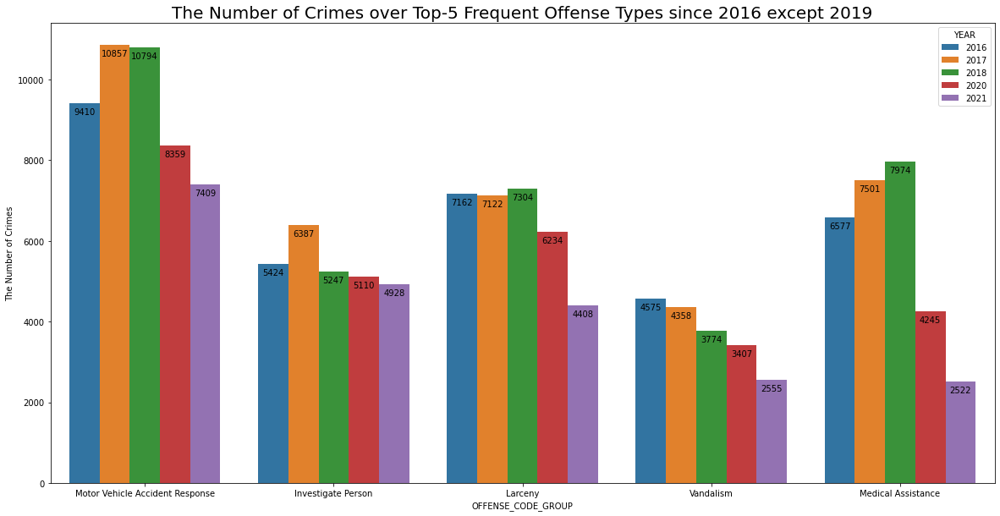

In [32]:
plt.figure(figsize= (20,10))
fig1 = sns.barplot(data=df, x='OFFENSE_CODE_GROUP', y='INCIDENT_NUMBER', hue='YEAR')
plt.ylabel('The Number of Crimes')
plt.title('The Number of Crimes over Top-5 Frequent Offense Types since 2016 except 2019', fontsize=20)

for i in fig1.patches:
    fig1.annotate(format(int(i.get_height())), 
                   (i.get_x() + i.get_width() / 2, i.get_height()), 
                   ha = 'center', va = 'center', 
                   size=10,
                   xytext = (0, -10), 
                   textcoords = 'offset points')
    
plt.show()


*   In general, we can see that the top 5 incidents over the course of the years include: Motor Vehicle Accident Response, Investigate Person, Larceny, Vandalism & Medical Assistance.
* Clear trend throughout the top 5 incidents of decreasing number of total Number of Crimes from 2018-2021

## By Year

###A general overview of criminal cases in different years

Because Boston Police Department criminal report for 2019 only begins from September due to a switch to a new database system, the following visualization will exclude 2019.

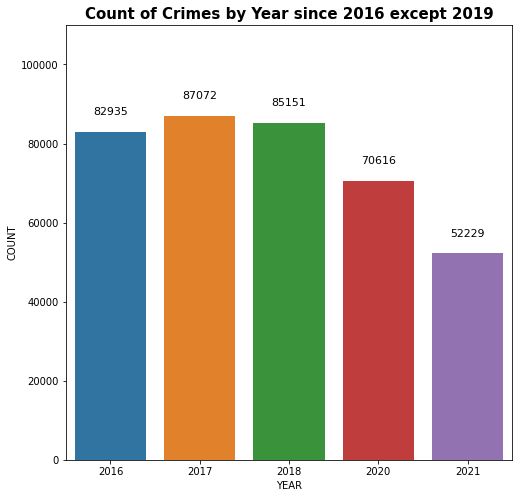

In [33]:
sns.set_context({"figure.figsize":(8,8)})
crimes_year = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby('YEAR').INCIDENT_NUMBER.agg(count='count')
crimes_year = pd.DataFrame({'YEAR':crimes_year.index,'COUNT':crimes_year['count']})
ax = sns.barplot(x=crimes_year.YEAR,y=crimes_year.COUNT,palette='tab10')
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 20),
                textcoords='offset points')
ax.set(ylim=(0, 110000))
ax.set_title('Count of Crimes by Year since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   Although 2019 is not shown, it is clear that the crime cases decreased since 2020, probably due to the COVID-19 pendamic.



## By Season

###Which season had the most crimes?

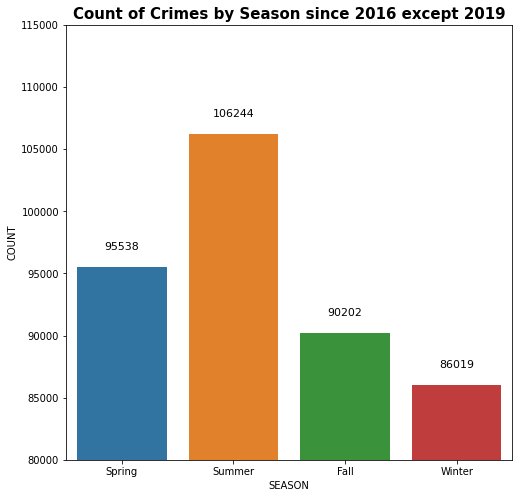

In [34]:
sns.set_context({"figure.figsize":(8,8)})
crimes_season = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby('SEASON')['index'].agg(count='count')
crimes_season = crimes_season.reindex(['Spring','Summer','Fall','Winter'])
crimes_season = pd.DataFrame({'SEASON':crimes_season.index,'COUNT':crimes_season['count']})
ax = sns.barplot(x=crimes_season.SEASON,y=crimes_season.COUNT,palette='tab10')
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 20),
                textcoords='offset points')
ax.set(ylim=(80000, 115000))
ax.set_title('Count of Crimes by Season since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});


*   In general, crimes occurred more in Summer and Spring.



###What were the most dangerous hours in a specific season?

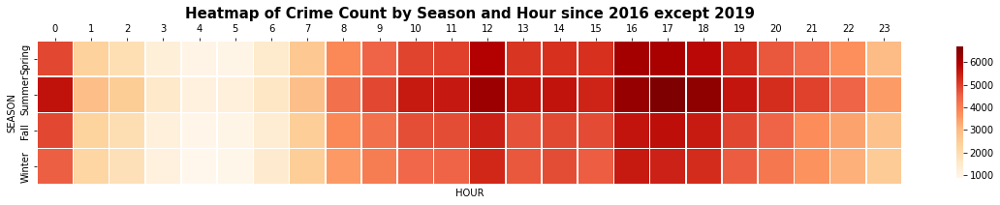

In [35]:
sns.set_context({"figure.figsize":(20,5)})
crimes_season_hour = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['SEASON','HOUR']).INCIDENT_NUMBER.aggregate('count').unstack()
crimes_season_hour = crimes_season_hour.reindex(['Spring','Summer','Fall','Winter'])
ax = sns.heatmap(crimes_season_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.5}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Crime Count by Season and Hour since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   The most frequent times for crimes in terms of season and hour were noon and evening in Spring and Summer, and midnight in Summer.



## By Holiday

###Which holidays have a high crime rate and which have a low crime rate?

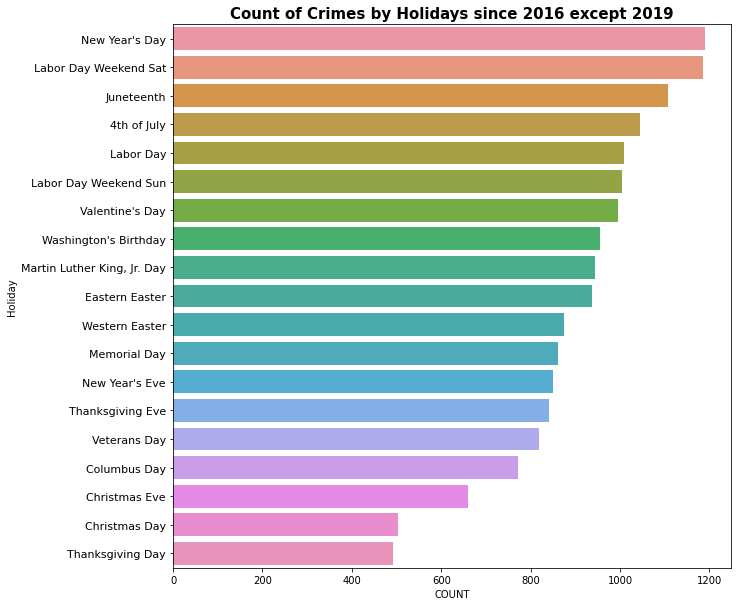

In [36]:
sns.set_context({"figure.figsize":(10,10)})
crimes_holiday=crimes_holidays[(crimes_holidays.YEAR!=2019) & (crimes_holidays.Holiday.isna()==False)].groupby('Holiday').INCIDENT_NUMBER.agg(count = 'count').sort_values(by='count',ascending=False)

crimes_holiday = pd.DataFrame({'Holiday':crimes_holiday.index,'COUNT':crimes_holiday['count']})
ax = sns.barplot(y=crimes_holiday.Holiday,x=crimes_holiday.COUNT)
ax.set_title('Count of Crimes by Holidays since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'})
ax.set_yticklabels(ax.get_yticklabels(),fontdict={'fontsize':11});



*   Since 2016, except for 2019, Labor Day Weekend Saturday and New Year's Day have the largest number of crime cases, while Cristmas and Tranksgiving have few crime cases.



## By Hour and Weekday

###During what time of day do criminal incidents frequently occur？

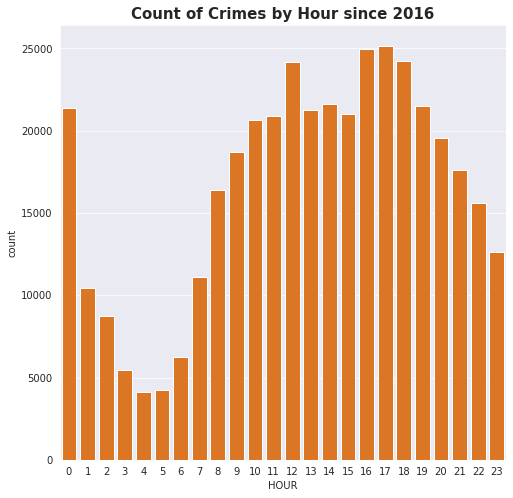

In [37]:
crimes_hour = Crimes_all_years.groupby('HOUR').size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
sns.set_style('darkgrid')
sns.set_context({"figure.figsize":(8,8)})
ax = sns.barplot(data=crimes_hour,x='HOUR',y='count',color='#F97306')
ax.set_title('Count of Crimes by Hour since 2016',fontdict= {'fontsize':15, 'fontweight':'bold'});

*   From the hourly crime count bar chart above, it is obvious that crimes more often occurred during daytimes than nighttimes, especially at 12 pm and 4-6 pm. Also, midnight AM was the most frequent hour for crime reports at night.

###Did this pattern vary a lot in different years?

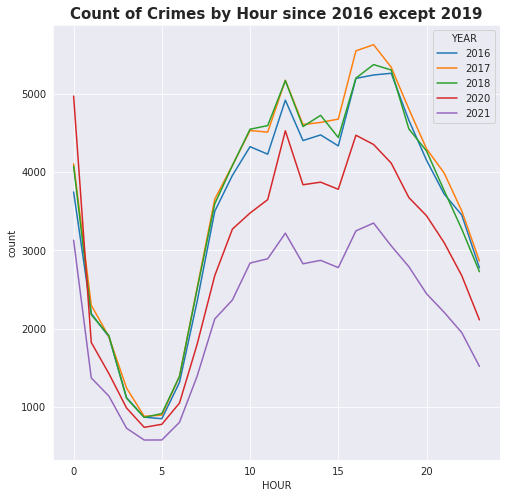

In [38]:
crimes_hour = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['HOUR','YEAR']).size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
ax = sns.lineplot(data=crimes_hour,x='HOUR',y='count',hue='YEAR',palette='tab10')
sns.set_context({"figure.figsize":(8,8)})
ax.set_title('Count of Crimes by Hour since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   From the above line chart, 2016 to present, except 2019 which is excluded because of missing data, generally have the same pattern on active hour of crime cases. 



###During which day of week do criminal cases frequently occur？

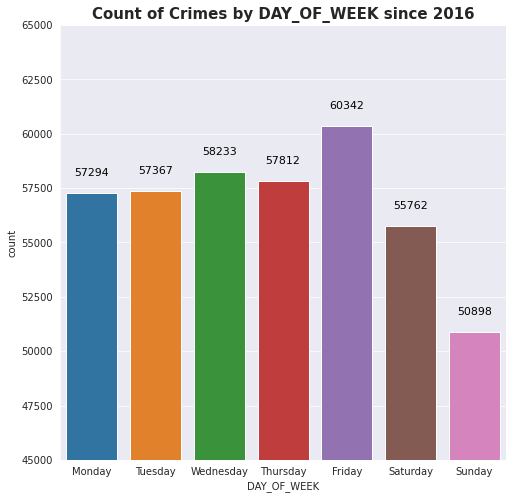

In [39]:
crimes_weekday = Crimes_all_years.groupby('DAY_OF_WEEK').size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
crimes_weekday = crimes_weekday.reindex([4,3,1,2,0,5,6])
sns.set_palette('bright')
ax = sns.barplot(data=crimes_weekday,x='DAY_OF_WEEK',y='count',palette='tab10')
ax.set_title('Count of Crimes by DAY_OF_WEEK since 2016', fontdict= {'fontsize':15, 'fontweight':'bold'})
for p in ax.patches:
    ax.annotate("%.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, color='black', xytext=(0, 20),
                textcoords='offset points')
ax.set_ylim(45000,65000);


*   From the day_of_week crime count above, we can see that Friday had the most crime cases and that there were less cases on weekends.



###What were the most dangerous hours on certain days of a week?

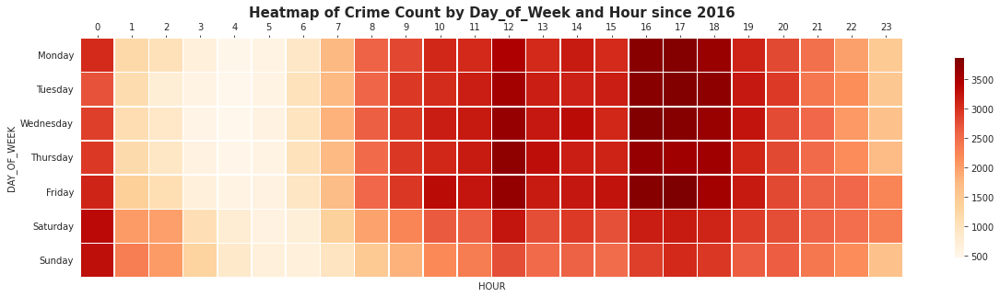

In [40]:
sns.set_context({"figure.figsize":(20,5)})
crimes_weekday_hour = Crimes_all_years.groupby(['DAY_OF_WEEK','HOUR']).INCIDENT_NUMBER.aggregate('count').unstack()
crimes_weekday_hour = crimes_weekday_hour.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_weekday_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Crime Count by Day_of_Week and Hour since 2016', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   The heatmap shows that crimes frequently occured durring daytime on weekdays, especially at noon and between 4 and 6 pm. In weekends, midgnight had the largest number of crimes. 



## By Offense Type

###What were the most commonly occurred crimes?

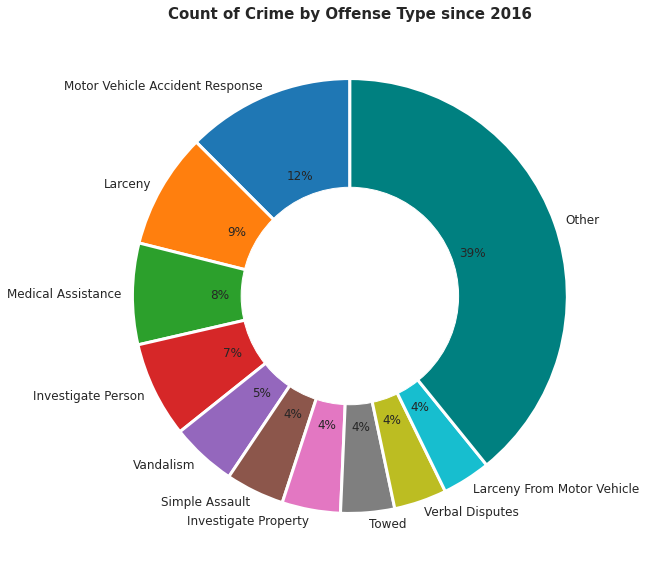

In [41]:
sns.set_context({"figure.figsize":(10,10)})
crimes_rank = Crimes_all_years.groupby('OFFENSE_CODE_GROUP').size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
crimes_rank_10 = crimes_rank[crimes_rank.OFFENSE_CODE_GROUP!='Other'][:10]
other = sum(crimes_rank['count'])-sum(crimes_rank_10['count'])
crimes_rank_10 = pd.concat([crimes_rank_10,pd.DataFrame({'OFFENSE_CODE_GROUP':['Other'],'count':[other]})],ignore_index=True)
plt.pie(crimes_rank_10['count'],labels=crimes_rank_10.OFFENSE_CODE_GROUP,startangle=90, labeldistance=1.05,\
        wedgeprops = { 'linewidth' : 3, 'edgecolor' : 'white' },\
        colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf','#008080'],\
        textprops={'fontsize': 12},autopct='%1.0f%%')
my_circle=plt.Circle( (0,0), 0.5, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('Count of Crime by Offense Type since 2016', fontdict= {'fontsize':15, 'fontweight':'bold'})
plt.show()



*   According to the donnut chart, Motor Vehicle Accident Response, Larceny, Medical Assistance were the top-3 crime report cases since 2016.



###Motor Vehicle Accidents, the most frequent case type, were more likely to be reported at what time?

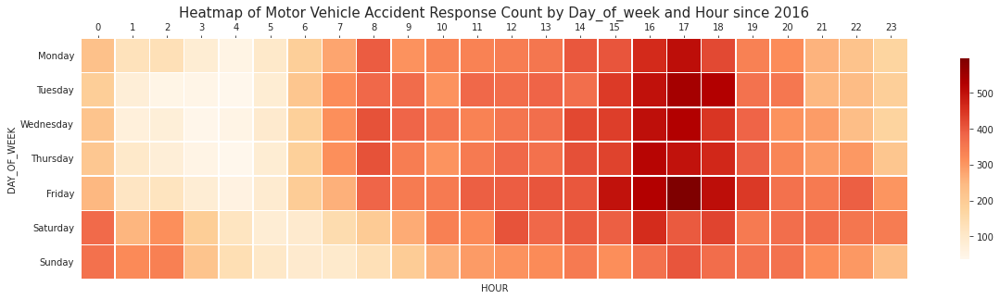

In [42]:
sns.set_context({"figure.figsize":(20,5)})
crimes_weekday_hour = Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response'].groupby(['DAY_OF_WEEK','HOUR']).INCIDENT_NUMBER.aggregate('count').unstack()
crimes_weekday_hour = crimes_weekday_hour.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_weekday_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Motor Vehicle Accident Response Count by Day_of_week and Hour since 2016', fontdict= {'fontsize':15});



*   Motor Vehicle Accident Response were morelikely to occur between 16 and 18 pm from Monday to Thursday. On Friday, it occurred more frequent between 15 to 18 pm. At weekend's nights, the cases occurred more often than at weekday nights between 0 to 2 am.



## By Street

###Top 5 frequent streets

In [43]:
street_rank = Crimes_all_years.groupby('STREET').INCIDENT_NUMBER.agg(count='count').sort_values(by='count',ascending=False)[:5]
street_rank

,count
STREET,
WASHINGTON ST,19331
BLUE HILL AVE,9492
BOYLSTON ST,7692
TREMONT ST,5993
DORCHESTER AVE,5953


###Top 5 frequent streets for Motor Vehicle Accidents

In [44]:
Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Motor Vehicle Accident Response'].groupby('STREET')['index'].agg(count='count').sort_values(by='count',ascending=False).head(5)

,count
STREET,
WASHINGTON ST,1850
BLUE HILL AVE,1637
DORCHESTER AVE,997
CENTRE ST,804
HYDE PARK AVE,773


###Top 5 frequent streets for Larceny

In [45]:
Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Larceny'].groupby('STREET')['index'].agg(count='count').sort_values(by='count',ascending=False).head(5)

,count
STREET,
WASHINGTON ST,2721
BOYLSTON ST,2552
NEWBURY ST,1230
HUNTINGTON AVE,1000
HARRISON AVE,754


## By District 

###What is the trend of total reported case number per year for each district?
(we only used data from Oct. to Dec. of each year for comparesion between years since the dateset only contain OCT to DEC for 2019)

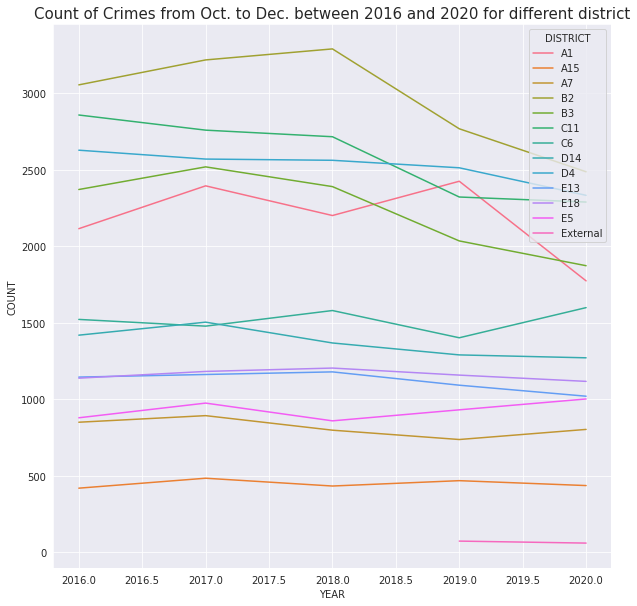

In [46]:
Crimes_all_years2 = Crimes_all_years[Crimes_all_years['MONTH'].isin([10,11,12])]
Crimes_all_years2=Crimes_all_years2[Crimes_all_years2['YEAR']!=2021]
crimes_year = Crimes_all_years2.groupby(['YEAR','DISTRICT'])['INCIDENT_NUMBER'].aggregate(COUNT = 'count')
sns.set_context({"figure.figsize":(10,10)})
ax = sns.lineplot(data=crimes_year,x='YEAR',y='COUNT',hue='DISTRICT')
ax.set_title('Count of Crimes from Oct. to Dec. between 2016 and 2020 for different district', fontdict= {'fontsize':15});

* Based on the graph, we can tell that those dangerous districts are experiencing an decreasing trend on the crime rate over the years. For safer districts, there are no significant changes.

###Does the month make a diffrence on reported case amount in each district?
(we excluded 2019's data for the month comparision)

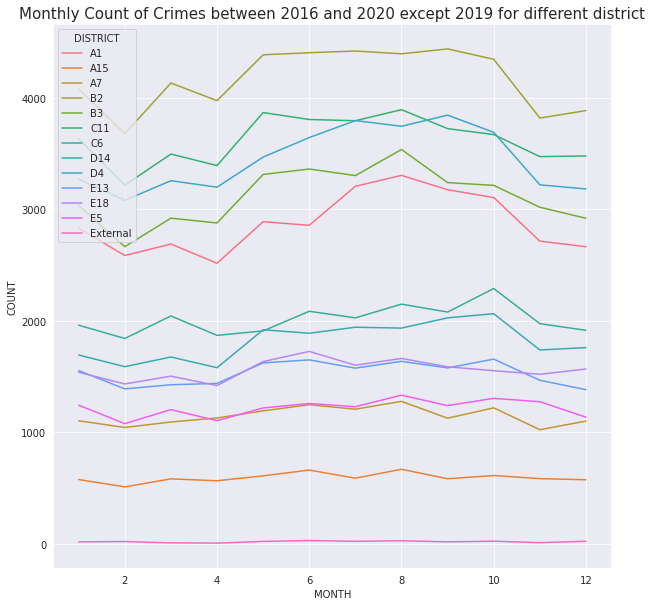

In [47]:
Crimes_all_years3=Crimes_all_years[(Crimes_all_years['YEAR']!=2019) & (Crimes_all_years['YEAR']!=2021)]
crimes_year = Crimes_all_years3.groupby(['MONTH','DISTRICT'])['INCIDENT_NUMBER'].aggregate(COUNT = 'count')
sns.set_context({"figure.figsize":(10,10)})
ax = sns.lineplot(data=crimes_year,x='MONTH',y='COUNT',hue='DISTRICT')
ax.set_title('Monthly Count of Crimes between 2016 and 2020 except 2019 for different district', fontdict= {'fontsize':15});

* Based on the graph above, we noticed that districts with a higher crime rate tend to be more sensitive to the month change. The month of August tends to have an higher crime rate within the year throughout all years.

##Shooting Cases

###Top 5 frequent streets for Shooting

In [48]:
crimes_shooting=Crimes_all_years[Crimes_all_years.SHOOTING==1].groupby('STREET').INCIDENT_NUMBER.aggregate(count = 'count').sort_values(by='count',ascending=False)
crimes_shooting.head(5)

,count
STREET,
WASHINGTON ST,84
BLUE HILL AVE,66
COLUMBIA RD,42
NORFOLK ST,27
CENTRE ST,25


###When did shooting cases most often occur?

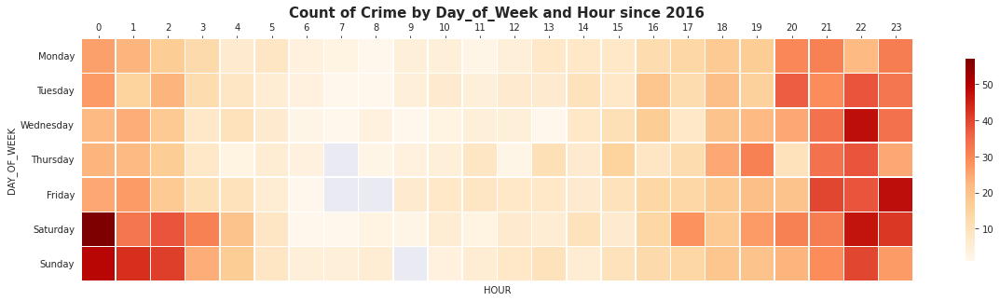

In [49]:
sns.set_context({"figure.figsize":(20,5)})
dd = Crimes_all_years[Crimes_all_years.SHOOTING==1].groupby(['DAY_OF_WEEK','HOUR']).INCIDENT_NUMBER.aggregate('count').unstack()
dd = dd.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(dd,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
ax.xaxis.tick_top()
ax.set_title('Count of Crime by Day_of_Week and Hour since 2016', fontdict= {'fontsize':15, 'fontweight':'bold'})
plt.show();



*   Shooting cases occurred mainly in the early mornings on the weekend and at night throughout the week.



###Interactive Heatmap with different year, shooting cases, offense type, reporting district and street.

In [50]:
# Creating an interactive heapmap with options of year, shooting cases, offense type, reporting district and incident street.
Year = widgets.Dropdown(
    options=['All'] + list(np.sort(Crimes_all_years.YEAR.unique())),
    value='All',
    description='Year:'
)
Shooting = widgets.Dropdown(
    options=['All'] + list(Crimes_all_years.groupby('SHOOTING').INCIDENT_NUMBER.agg(Count='count').sort_values(by='Count',ascending=False).index),
    value='All',
    description='Shooting:'
)
Type = widgets.Dropdown(
    options=['All'] + list(Crimes_all_years.groupby('OFFENSE_CODE_GROUP').INCIDENT_NUMBER.agg(Count='count').sort_values(by='Count',ascending=False).index),
    value='All',
    description='Crime:',
)
Street = widgets.Dropdown(
    options=['All'] + list(Crimes_all_years.groupby('STREET').INCIDENT_NUMBER.agg(Count='count').sort_values(by='Count',ascending=False).index),
    value='All',
    description='Street:'
)
District = widgets.Dropdown(
    options=['All'] + list(np.sort(Crimes_all_years.DISTRICT.unique())),
    value='All',
    description='Report Dist:'
)

def update_shooting(*args):
    if (Shooting.value=='All') & (Type.value!='All'):
        Shooting.options = ['All'] + list(np.sort(Crimes_all_years[Crimes_all_years.OFFENSE_CODE_GROUP==Type.value].SHOOTING.unique()))

def update_type(*args):
    if (Type.value=='All') & (Shooting!='All'):
        Type.options = ['All'] + list(Crimes_all_years[Crimes_all_years.SHOOTING==Shooting.value].groupby('OFFENSE_CODE_GROUP').INCIDENT_NUMBER.agg(Count='count').sort_values(by='Count',ascending=False).index)

Type.observe(update_shooting,'value')
Shooting.observe(update_type,'value')

def update_street(*args):
    if (Street.value=='All') & (District.value!='All'):
        Street.options = ['All'] + list(Crimes_all_years[Crimes_all_years.DISTRICT==District.value].groupby('STREET').INCIDENT_NUMBER.agg(Count='count').sort_values(by='Count',ascending=False).index)

def update_district(*args):
    if (District.value=='All') & (Street.value!='All'):
        District.options = ['All'] + list(np.sort(Crimes_all_years[Crimes_all_years.STREET==Street.value].DISTRICT.unique()))

District.observe(update_street, 'value')
Street.observe(update_district,'value')

def plotit(Year, Shooting, Type, District, Street):
    dd = Crimes_all_years.copy()
    if Year != 'All':
        dd = dd[dd.YEAR == Year]
    if Shooting != 'All':
        dd = dd[dd.SHOOTING == Shooting]
    if Type != 'All':
        dd = dd[dd.OFFENSE_CODE_GROUP == Type]
    if District != 'All':
        dd = dd[dd.DISTRICT == District]
    if Street != 'All':
        dd = dd[dd.STREET == Street]
    # Plot it (only if there's data to plot)
    if len(dd) > 0:
        sns.set_context({"figure.figsize":(20,5)})
        dd = dd.groupby(['DAY_OF_WEEK','HOUR']).INCIDENT_NUMBER.aggregate('count').unstack()
        dd = dd.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
        ax = sns.heatmap(dd,square=True,annot=False,fmt="d",cmap="coolwarm",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
        ax.xaxis.tick_top()
        ax.set_title('Count of Crime by Day_of_Week and Hour \nYear={}, Offense Type={}, District={}, Street={}'.format(Year, Type, District, Street), fontdict= {'fontsize':15, 'fontweight':'bold'})
        plt.show();
    else:
        print("No data to show for current selection.")

interactive(plotit, Shooting=Shooting, Year=Year, Type=Type, District=District, Street=Street)

interactive(children=(Dropdown(description='Year:', options=('All', 2016, 2017, 2018, 2019, 2020, 2021), value…

## Mark Cluster Map



In [51]:
df=Crimes_all_years

In [52]:
df.head()

,index,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,STREET,Lat,Long,Location,OFFENSE_CODE_GROUP,SEASON
0,0,I192074738,2629,HARASSMENT,C11,240,0,2016-09-01,2016,9,Thursday,0,CONRAD ST,42.318724,-71.062001,"(42.31872369, -71.06200077)",Harassment,Fall
1,1,I192073288,802,ASSAULT SIMPLE - BATTERY,D14,760,0,2016-09-01,2016,9,Thursday,9,BEECHCROFT ST,42.351673,-71.161152,"(42.35167293, -71.16115206)",Simple Assault,Fall
2,2,I192071326,619,LARCENY ALL OTHERS,A1,113,0,2016-08-02,2016,8,Tuesday,0,HIGH ST,42.353448,-71.056581,"(42.35344834, -71.05658072)",Larceny,Summer
3,4,I192071292,1107,FRAUD - IMPERSONATION,B2,328,0,2016-09-06,2016,9,Tuesday,13,FERNBORO ST,42.311296,-71.077283,"(42.31129587, -71.07728269)",Fraud,Fall
4,5,I192069941,1102,FRAUD - FALSE PRETENSE / SCHEME,B2,614,0,2016-06-21,2016,6,Tuesday,12,BLACKFAN CIR,42.339170,-71.103583,"(42.33916952, -71.10358341)",Fraud,Summer




*   Creating a new dataframe called 'df1' and sorting it  by district to get a random sample of the data by different years to plot it on the maps and chloropleth map using latitude and longitude to explore locations of crimes on a map.



In [53]:
df1 = df.sort_values(by='DISTRICT').reset_index()

In [54]:
limit = 5000
df1 = df1.iloc[0:limit, :]
print(len(df1))

5000




*   Checking for (0.0,0.0) latitude and longitude and excluding them from the datframe to get rid of outliers in the map.



In [55]:
df1=df1.dropna(subset=['Long'])
df1=df1.dropna(subset=['Lat'])

In [56]:
df1= df1[df1.Lat != 0.0]


In [57]:
#df=df.dropna(subset=['Long'])
#df=df.dropna(subset=['Lat'])

In [58]:
#setting the map for Boston
latitude = 42.3601
longitude = -71.0589
boston_map = folium.Map(location=[latitude, longitude], zoom_start=12)



*   Marking locations on the graph by latitude and longitude and labeling the places with respective offense group codes.


In [59]:
incidents = folium.map.FeatureGroup()
for lat, lng, in zip(df1.Lat, df1.Long):
 incidents.add_child(
 folium.CircleMarker(
 [lat, lng],
 radius=5, 
 color='yellow',
 fill=True,
 fill_color='blue',
 fill_opacity=0.6
 )
)
#boston_map.add_child(incidents)

In [60]:
incidents = folium.map.FeatureGroup()
for lat, lng, code,year in zip(df1.Lat, df1.Long,df1.OFFENSE_CODE_GROUP,df1.YEAR):
 incidents.add_child(
 folium.CircleMarker(
 [lat, lng],
 radius=5, 
 color='yellow',
 fill=True,
 fill_color='red',
 fill_opacity=0.6
   )
 )
latitudes = list(df1.Lat)
longitudes = list(df1.Long)
labels = list(df1.OFFENSE_CODE_GROUP)
years=list(df1.YEAR)
for lat, lng, labels,year in zip(latitudes, longitudes, labels,years):
  folium.Marker([lat, lng], popup='{}, {}'.format(labels,year)).add_to(boston_map) 
 

#boston_map.add_child(incidents)
 

In [61]:
from folium import plugins
boston_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
incidents = plugins.MarkerCluster().add_to(boston_map)
for lat, lng, label,year in zip(df1.Lat, df1.Long, df1.OFFENSE_CODE_GROUP,df1.YEAR):
 folium.Marker(
 location=[lat, lng],
 icon=None,
 popup='{}, {}'.format(label,year),
 ).add_to(incidents)
# display map
boston_map

## Heat Map


*   A heat map is plotted using latitude and longitude and the color gradients on it indicate the magnitude of crimes in that place.



In [62]:
from folium import Choropleth, Circle, Marker, Map
from folium.plugins import HeatMap, MarkerCluster
import plotly.express as px
import plotly.graph_objects as go
import math

In [63]:
#re-setting the map for Boston
boston_map = folium.Map(location=[latitude, longitude], zoom_start=12)

In [64]:
df=pd.read_csv("/content/crimes_all_years.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (1,3,7,13) have mixed types.Specify dtype option on import or set low_memory=False.



In [65]:
df= df[df.Lat != 0.0]


In [66]:
df.head()

,Unnamed: 0,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,0,I192074738,2629,Harassment,HARASSMENT,C11,240,NaN,2016-09-01 00:00:00,2016,9,Thursday,0,Part Two,CONRAD ST,42.318724,-71.062001,"(42.31872369, -71.06200077)"
1,1,I192073288,802,Simple Assault,ASSAULT SIMPLE - BATTERY,D14,760,NaN,2016-09-01 09:00:00,2016,9,Thursday,9,Part Two,BEECHCROFT ST,42.351673,-71.161152,"(42.35167293, -71.16115206)"
2,2,I192071326,619,Larceny,LARCENY ALL OTHERS,A1,113,NaN,2016-08-02 00:00:00,2016,8,Tuesday,0,Part One,HIGH ST,42.353448,-71.056581,"(42.35344834, -71.05658072)"
3,3,I192071326,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,A1,113,NaN,2016-08-02 00:00:00,2016,8,Tuesday,0,Part Two,HIGH ST,42.353448,-71.056581,"(42.35344834, -71.05658072)"
4,4,I192071292,1107,Fraud,FRAUD - IMPERSONATION,B2,328,NaN,2016-09-06 13:01:00,2016,9,Tuesday,13,Part Two,FERNBORO ST,42.311296,-71.077283,"(42.31129587, -71.07728269)"




*   The count of crimes are classified with numbers and different colors show the count of crimes in that area on the heat map.



In [67]:
location=df.groupby(['Lat','Long','OFFENSE_CODE_GROUP']).size().reset_index(name='count').sort_values(by='count',ascending=False)
location=location[location['count']>=5]
location['color']=location['count'].apply(lambda count:"Black" if count>=400 else
                                         "green" if count>=300 and count<400 else
                                         "Orange" if count>=200 and count<300 else
                                         "darkblue" if count>=150 and count<200 else
                                         "red" if count>=100 and count<150 else
                                         "lightblue" if count>=75 and count<100 else
                                         "brown" if count>=50 and count<75 else
                                         "grey")
location['size']=location['count'].apply(lambda count:12 if count>=400 else
                                         10 if count>=300 and count<400 else
                                         8 if count>=200 and count<300 else
                                         6 if count>=150 and count<200 else
                                         4 if count>=100 and count<150 else
                                         2 if count>=75 and count<100 else
                                         1 if count>=50 and count<75 else
                                         0.1)
location

,Lat,Long,OFFENSE_CODE_GROUP,count,color,size
91859,42.348624,-71.082776,Larceny,760,Black,12.0
19730,42.284826,-71.091374,Drug Violation,457,Black,12.0
2949,42.256216,-71.124019,Investigate Property,373,green,10.0
...,...,...,...,...,...,...
92651,42.349020,-71.081301,Motor Vehicle Accident Response,5,grey,0.1
72925,42.332714,-71.035293,Towed,5,grey,0.1
26871,42.290425,-71.090491,Verbal Disputes,5,grey,0.1


In [68]:
m=folium.Map([42.3602,-71.0589],zoom_start=11)
location=location[0:2000]
for lat,lon,color,count,size,off in zip(location['Lat'],location['Long'],location['color'],location['count'],location['size'],location['OFFENSE_CODE_GROUP']):
     folium.CircleMarker([lat, lon],
                            popup=off,
                            radius=size,
                            color='b',
                            fill=True,
                            fill_opacity=0.7,
                            fill_color=color,
                           ).add_to(m)

#m.save('boston_crime.html')
#m


* From the map we can see the bigger sized black circle (count>=400) has had the highest crimes. Be careful!.

In [69]:
# convert to (n, 2) nd-array format for heatmap
location1=location[0:200]
location_data = location[['Lat', 'Long']].values

# plot heatmap
m.add_child(plugins.HeatMap(location_data, radius=15))
#m.save('heatmap.html')
m



*   The heatmap above shows the intensity of crimes in each place at Boston.



# **4. Machine Learning**

In [76]:
df3=pd.read_csv('/content/Crimes2.csv',low_memory=False,index_col=0)

df3=pd.get_dummies(df3,columns=['DISTRICT','SEASON','DAY_OF_WEEK','OFFENSE_CODE_GROUP'])
df3=df3.drop('index',axis=1)
df3['OCCURRED_ON_DATE']=(pd.to_datetime(df3['OCCURRED_ON_DATE'])-pd.to_datetime('2016-01-01')).astype('timedelta64[D]').astype('int64')


In [77]:
df3.to_csv("Final_data_crimes.csv")

In [78]:
df4=pd.read_csv("/content/Final_data_crimes.csv",low_memory=False,index_col=0)

In [73]:
df4.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_DESCRIPTION,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,HOUR,STREET,Lat,Long,Location,DISTRICT_A1,DISTRICT_A15,DISTRICT_A7,DISTRICT_B2,DISTRICT_B3,DISTRICT_C11,DISTRICT_C6,DISTRICT_D14,DISTRICT_D4,DISTRICT_E13,DISTRICT_E18,DISTRICT_E5,DISTRICT_External,SEASON_Fall,SEASON_Spring,SEASON_Summer,SEASON_Winter,DAY_OF_WEEK_Friday,DAY_OF_WEEK_Monday,DAY_OF_WEEK_Saturday,DAY_OF_WEEK_Sunday,DAY_OF_WEEK_Thursday,DAY_OF_WEEK_Tuesday,DAY_OF_WEEK_Wednesday,OFFENSE_CODE_GROUP_Aggravated Assault,OFFENSE_CODE_GROUP_Aircraft,OFFENSE_CODE_GROUP_Arson,OFFENSE_CODE_GROUP_Assembly Or Gathering Violations,OFFENSE_CODE_GROUP_Auto Theft,OFFENSE_CODE_GROUP_Auto Theft Recovery,OFFENSE_CODE_GROUP_BREAKING AND ENTERING (B&E) MOTOR VEHICL,OFFENSE_CODE_GROUP_BREAKING AND ENTERING (B&E) MOTOR VEHICLE (NO PROPERTY STOLEN,OFFENSE_CODE_GROUP_Ballistics,OFFENSE_CODE_GROUP_Biological Threat,OFFENSE_CODE_GROUP_Bomb Hoax,OFFENSE_CODE_GROUP_Commercial Burglary,OFFENSE_CODE_GROUP_Confidence Games,OFFENSE_CODE_GROUP_Counterfeiting,OFFENSE_CODE_GROUP_Criminal Harassment,OFFENSE_CODE_GROUP_Disorderly Conduct,OFFENSE_CODE_GROUP_Drug Violation,OFFENSE_CODE_GROUP_Embezzlement,OFFENSE_CODE_GROUP_Evading Fare,OFFENSE_CODE_GROUP_Evidence Tracker Incident,OFFENSE_CODE_GROUP_Explosives,OFFENSE_CODE_GROUP_Fire Related Reports,OFFENSE_CODE_GROUP_Firearm Discovery,OFFENSE_CODE_GROUP_Firearm Violations,OFFENSE_CODE_GROUP_Fraud,OFFENSE_CODE_GROUP_Gambling,OFFENSE_CODE_GROUP_Harassment,OFFENSE_CODE_GROUP_Harbor Related Incidents,OFFENSE_CODE_GROUP_Home Invasion,OFFENSE_CODE_GROUP_Homicide,OFFENSE_CODE_GROUP_Human Trafficking,OFFENSE_CODE_GROUP_Human Trafficking - Involuntary Servitude,OFFENSE_CODE_GROUP_Investigate Person,OFFENSE_CODE_GROUP_Investigate Property,OFFENSE_CODE_GROUP_Justifiable Homicid,OFFENSE_CODE_GROUP_Landlord/Tenant Disputes,OFFENSE_CODE_GROUP_Larceny,OFFENSE_CODE_GROUP_Larceny From Motor Vehicle,OFFENSE_CODE_GROUP_License Plate Related Incidents,OFFENSE_CODE_GROUP_License Violation,OFFENSE_CODE_GROUP_Liquor Violation,OFFENSE_CODE_GROUP_Manslaughter,OFFENSE_CODE_GROUP_Medical Assistance,OFFENSE_CODE_GROUP_Migrated Report,OFFENSE_CODE_GROUP_Missing Person Located,OFFENSE_CODE_GROUP_Missing Person Reported,OFFENSE_CODE_GROUP_Motor Vehicle Accident Response,OFFENSE_CODE_GROUP_Offenses Against Child / Family,OFFENSE_CODE_GROUP_Operating Under The Influence,OFFENSE_CODE_GROUP_Other,OFFENSE_CODE_GROUP_Other Burglary,OFFENSE_CODE_GROUP_Phone Call Complaints,OFFENSE_CODE_GROUP_Police Service Incidents,OFFENSE_CODE_GROUP_Prisoner Related Incidents,OFFENSE_CODE_GROUP_Property Found,OFFENSE_CODE_GROUP_Property Lost,OFFENSE_CODE_GROUP_Property Related Damage,OFFENSE_CODE_GROUP_Prostitution,OFFENSE_CODE_GROUP_RECOVERED,OFFENSE_CODE_GROUP_Recovered Stolen Property,OFFENSE_CODE_GROUP_Residential Burglary,OFFENSE_CODE_GROUP_Restraining Order Violations,OFFENSE_CODE_GROUP_Robbery,OFFENSE_CODE_GROUP_SICK ASSIS,OFFENSE_CODE_GROUP_Search Warrants,OFFENSE_CODE_GROUP_Service,OFFENSE_CODE_GROUP_Simple Assault,OFFENSE_CODE_GROUP_Towed,OFFENSE_CODE_GROUP_VIOLATION,OFFENSE_CODE_GROUP_Vandalism,OFFENSE_CODE_GROUP_Verbal Disputes,OFFENSE_CODE_GROUP_Violations,OFFENSE_CODE_GROUP_WARRANT ARREST,OFFENSE_CODE_GROUP_Warrant Arrests,REPORTING_AREA_,REPORTING_AREA_000,REPORTING_AREA_1,REPORTING_AREA_10,REPORTING_AREA_100,REPORTING_AREA_101,REPORTING_AREA_102,REPORTING_AREA_103,REPORTING_AREA_104,REPORTING_AREA_105,REPORTING_AREA_106,REPORTING_AREA_107,REPORTING_AREA_108,REPORTING_AREA_109,REPORTING_AREA_11,REPORTING_AREA_110,REPORTING_AREA_111,REPORTING_AREA_112,REPORTING_AREA_113,REPORTING_AREA_114,REPORTING_AREA_115,REPORTING_AREA_116,REPORTING_AREA_117,REPORTING_AREA_118,REPORTING_AREA_119,REPORTING_AREA_12,REPORTING_AREA_120,REPORTING_AREA_121,REPORTING_AREA_122,REPORTING_AREA_123,REPORTING_AREA_124,REPORTING_AREA_125,REPORTING_AREA_126,REPORTING_AREA_127,REPORTING_AREA_128,REPORTING_AREA_129,REPORTING_AREA_13,REPORTING_AREA_130,REPORTING_AREA_131,REPORTING_AREA_13

In [79]:
import sklearn
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

In [80]:
X = df4.drop(['SHOOTING','OFFENSE_CODE','REPORTING_AREA','OCCURRED_ON_DATE','OFFENSE_DESCRIPTION','INCIDENT_NUMBER','STREET','Lat','Long','Location'],axis=1)
y=df4['SHOOTING']

Xtrain,Xtest,ytrain,ytest =  train_test_split(X,y,test_size=0.3,random_state=780)

In [81]:
len(ytrain)

278395

## Resampling

1.   undersampling
2.   oversampling





In [82]:
# UNDER SAMPLING
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import ClusterCentroids
from collections import Counter
print('Original dataset shape %s' % Counter(y))
rus = RandomUnderSampler(sampling_strategy='majority')
x_res, y_res = rus.fit_resample(Xtrain, ytrain)
print('Resampled dataset shape %s' % Counter(y_res))

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.



Original dataset shape Counter({0: 395107, 1: 2601})
Resampled dataset shape Counter({0: 1826, 1: 1826})


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



In [83]:
#oversampling
from imblearn.over_sampling import RandomOverSampler
print('Original dataset shape %s' % Counter(y))
rus_over = RandomOverSampler(random_state=42)
x_res_over, y_res_over = rus_over.fit_resample(Xtrain, ytrain)#resampling only for train data
print('Resampled dataset shape %s' % Counter(y_res_over))

Original dataset shape Counter({0: 395107, 1: 2601})


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



Resampled dataset shape Counter({0: 276569, 1: 276569})


In [84]:
len(x_res)

3652

## Machine learning class code

In [85]:
class machineLearning():
    mlReport=None
    Xtrain=None
    Xtest=None
    ytrain=None
    ytest=None
    resample=None

    def __init__(self,resample,Xtrain,Xtest,ytrain,ytest):
        self.Xtrain=Xtrain
        self.Xtest=Xtest
        self.ytrain=ytrain
        self.ytest=ytest
        self.resample=resample
        self.mlReport={'method':[],'predictions':[],'accuracy_score':[],'roc_auc_score':[]}
    def run(self,method):
        from sklearn.metrics import accuracy_score
        from sklearn.metrics import roc_auc_score
        if method=='LogisticRegression':
            from sklearn.linear_model import LogisticRegression
            model=LogisticRegression(solver='liblinear').fit(Xtrain,ytrain)
        elif method=='KNeighbors':
            from sklearn.neighbors import KNeighborsClassifier
            model=KNeighborsClassifier(n_neighbors=6).fit(Xtrain,ytrain)  
        elif method=='DecisionTree':  
            from sklearn.tree import DecisionTreeClassifier
            model=DecisionTreeClassifier().fit(Xtrain,ytrain)    
        elif method=='MultinaomialNaiveBayes':
            from sklearn.naive_bayes import MultinomialNB        
            model=MultinomialNB().fit(Xtrain,ytrain)
        elif method=='SupportVectorMachine':  
            from sklearn.svm import SVC
            model=SVC(kernel='linear').fit(Xtrain,ytrain)
        elif method=='RandomForest':
            from sklearn.ensemble import RandomForestClassifier
            model=RandomForestClassifier(random_state=41,n_jobs=1,max_depth=5,n_estimators=100,oob_score=True).fit(x_res,y_res)
        elif method=='RidgeCV':
            from sklearn.linear_model import RidgeClassifierCV
            model=RidgeClassifierCV(cv=5).fit(Xtrain,ytrain)
        if method not in self.mlReport['method']:
            self.mlReport['method'].append(method)
            predictions = model.predict(Xtest)
            self.mlReport['predictions'].append(predictions)
            self.mlReport['roc_auc_score'].append(roc_auc_score(ytest, predictions))
            self.mlReport['accuracy_score'].append(accuracy_score(ytest, predictions))
            model=None
        else:
            index=self.mlReport['method'].index(method)
            predictions = model.predict(Xtest)
            self.mlReport['predictions'][index]=predictions
            self.mlReport['roc_auc_score'][index]=roc_auc_score(ytest, predictions)
            self.mlReport['accuracy_score'][index]=(accuracy_score(ytest, predictions))
            model=None
    def report(self,method):
        from sklearn.metrics import classification_report, confusion_matrix
        index=self.mlReport['method'].index(method)
        print(method)
        print()
        print('confusion matrix:')
        print(confusion_matrix(self.ytest,self.mlReport['predictions'][index]))        
        print()
        print('classification report:')
        print(classification_report(self.ytest,self.mlReport['predictions'][index]))    
        print()
        print('accuracy_score:')
        print(str(np.round(self.mlReport['accuracy_score'][index]*100,2))+"%")
        print('roc_auc_score:')
        print(str(np.round(self.mlReport['roc_auc_score'][index]*100,2))+"%")
    def report_all(self):
        auc_perc = np.round(np.array(self.mlReport['roc_auc_score'])*100,2)
        acc_perc = np.round(np.array(self.mlReport['accuracy_score'])*100,2)
        auc_all = []
        acc_all = []
        for i in auc_perc:
            auc_all.append(str(i)+'%')
        for i in acc_perc:
            acc_all.append(str(i)+'%')
        return pd.DataFrame({'method':self.mlReport['method'],'accuracy_score':acc_all,'roc_auc_score':auc_all,'resample':[self.resample]*len(self.mlReport['method'])})


## Machine learning using under resampling



1.   Logistic Regression
2.   K-Nearest Neighbors
3.   Decision Tree
4.   Multinaomial Naive Bayes
5.   Random Forest
6.   5-fold Cross Validation Ridge



In [ ]:
# For checking confusion matrixes and classification reports, please remove the '#' in front of the report code accordingly
ml_res=machineLearning('under',x_res,Xtest,y_res,ytest)
ml_res.run('LogisticRegression')
#ml_res.report('LogisticRegression')
ml_res.run('KNeighbors')
#ml_res.report('KNeighbors')
ml_res.run('DecisionTree')
#ml_res.report('DecisionTree')
ml_res.run('MultinaomialNaiveBayes')
#ml_res.report('MultinaomialNaiveBayes')
ml_res.run('RandomForest')
#ml_res.report('RandomForest')
ml_res.run('RidgeCV')
#ml_res.report('RidgeCV')

*  Model Comparison

In [ ]:
ml_res.report_all()

## Machine learning using over resampling



1.   Logistic Regression
2.   K-Nearest Neighbors
3.   Decision Tree
4.   Multinaomial Naive Bayes
5.   Random Forest
6.   5-fold Cross Validation Ridge



In [ ]:
# For checking confusion matrixes and classification reports, please remove the '#' in front of the report code accordingly
ml_res_over=machineLearning('over',x_res_over,Xtest,y_res_over,ytest)
ml_res_over.run('LogisticRegression')
#ml_res_over.report('LogisticRegression')
ml_res_over.run('KNeighbors')
#ml_res_over.report('KNeighbors')
ml_res_over.run('DecisionTree')
#ml_res_over.report('DecisionTree')
ml_res_over.run('MultinaomialNaiveBayes')
#ml_res_over.report('MultinaomialNaiveBayes')
ml_res_over.run('RandomForest')
#ml_res_over.report('RandomForest')
ml_res_over.run('RidgeCV')
#ml_res_over.report('RidgeCV')



*   Model Comparison



In [ ]:
ml_res_over.report_all()

## Overall Machine Learning Report

In [ ]:
pd.set_option('display.max_rows',None)

In [ ]:
conclude = pd.concat([ml_res.report_all(),ml_res_over.report_all()],ignore_index=True)
conclude



*   Considering both accuracy scores and auc scores, the Random Forest model gives the best result of machine learning.



In [ ]:
ml_res.report(conclude[conclude.roc_auc_score==max(conclude.roc_auc_score)].reset_index().method[0])

# **5. Findings**

Overall we have found insightful trends within the Boston Crime Scene over the past couple of years. The most important takeaways we take from our analysis include:
1. The numbers of criminal cases had a huge drop in 2020, camparing to previous years, probably because of the Covid-19 pandemics.
2. Sumemr has the highest ciminal case frequency, Spring is the next.
3. In general, crimes occurred more often during daytime than nighttime between Monday and Friday. The peak hours are noon and 4-6 pm. 0 am has the highest ciminal case frequency at night thoughout the week.
4. For holidays, Labor Day Weekend Saturday and New Year's Day have the highest crime rate while Christmas and Thanksgiving have the lowest crime rate.
5. Among all types of crime reports, Motor Vehicle Accident Response is the most frequent one. It generally occurred on commuting time during weekdays, as well as 0-2 am and afternoon in weekends. 
6. Washington Steet has the most criminal cases, probably because it's the longest street in Boston.
7. Districts with higher averge crime rate are experiencing an decreasing trend throughout 2016 to 2020.( 2019 data was included in this part of analysis, we only used Oct to Dec data from each year.)
8. Most of the districts' crime rate are senestive to change on the month and holiday, but most of them are not sensetive to change on the day of week.
9. Shooting cases occurred mainly in the early mornings on the weekend and at night throughout the week.
10. Considering both accuracy scores and auc scores, the Random Forest model gives the best result of machine learning.





# **6. Suggestions**

# **7. Further Analysis**

###Clustered Bar chart for top-5 frequent offense groups

In [ ]:
# number of crimes over offense groups by year

df = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['OFFENSE_CODE_GROUP','YEAR'])['INCIDENT_NUMBER'].count().reset_index()
df = df.sort_values(by=['YEAR','INCIDENT_NUMBER'], ascending=False)
df = df[df['OFFENSE_CODE_GROUP'].isin(dftop6.OFFENSE_CODE_GROUP)]

df[df.YEAR==2021]
plt.figure(figsize= (20,10))
fig2 = sns.barplot(data=df, x='YEAR', y='INCIDENT_NUMBER', hue='OFFENSE_CODE_GROUP')
plt.ylabel('The Number of Crimes')
plt.title('The Number of Crimes over Offense Group', fontsize=20)

for i in fig2.patches:
    fig2.annotate(format(int(i.get_height())), 
                   (i.get_x() + i.get_width() / 2, i.get_height()), 
                   ha = 'center', va = 'center', 
                   size=10,
                   xytext = (0, -10), 
                   textcoords = 'offset points')
    
plt.show()

###Lollipop chart for holiday crimes

In [ ]:
sns.set_context({"figure.figsize":(10,10)})
crimes_holiday=crimes_holidays[(crimes_holidays.YEAR!=2019) & (crimes_holidays.Holiday.isna()==False)].groupby('Holiday').INCIDENT_NUMBER.agg(count = 'count').sort_values(by='count',ascending=True)
crimes_holiday = pd.DataFrame({'Holiday':crimes_holiday.index,'COUNT':crimes_holiday['count']})
fig, axes = plt.subplots()
axes.barh(crimes_holiday['Holiday'], crimes_holiday['COUNT'],color='silver',height=0.2)
axes.plot(crimes_holiday['COUNT'], crimes_holiday['Holiday'], "o",color="#69b3a2",markersize=11)
axes.set_xlim(0)
  
# formatting and details
plt.xlabel('COUNT',fontdict={'fontsize':15})
plt.ylabel('Holiday',fontdict={'fontsize':15})
plt.title('Count of Crimes by Holidays since 2016 except 2019', fontdict= {'fontsize':20, 'fontweight':'bold'})
plt.yticks(crimes_holiday['Holiday'],fontsize=12)
bottom,top=plt.ylim()
plt.ylim(bottom - 0.5, top + 0.5)
plt.xticks(fontsize=15);

###Did the pattern for day of week vary a lot in different years?

In [ ]:
crimes_weekday = Crimes_all_years[Crimes_all_years.YEAR!=2019].groupby(['DAY_OF_WEEK','YEAR']).size().to_frame('count')
def sort():
    weekday= ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    YEAR = [2016, 2017, 2018, 2020, 2021]
    return [(i,j) for i in weekday for j in YEAR]
crimes_weekday = crimes_weekday.reindex(sort())
ax = sns.lineplot(data=crimes_weekday,x='DAY_OF_WEEK',y='count',hue='YEAR',palette='tab10')
ax.set_title('Count of Crimes by Hour since 2016 except 2019', fontdict= {'fontsize':15, 'fontweight':'bold'});



*   From the above line chart, 2016 to present except 2019 which is excluded because of missing data, generally have the same pattern on active hour of crime cases. Moreover, it is obvious that the general crime rate dropped in 2020, probably due to the Covid-19 pandemics.



###Bar chart for top-10 frequent offense type

In [ ]:
sns.set_style('darkgrid')
sns.set_context({"figure.figsize":(10,10)})
crimes_rank = Crimes_all_years.groupby('OFFENSE_CODE_GROUP').size().to_frame('count').sort_values(by='count', ascending=False).reset_index()
crimes_rank_10 = crimes_rank[crimes_rank.OFFENSE_CODE_GROUP!='Other'][:10]
other = sum(crimes_rank['count'])-sum(crimes_rank_10['count'])
crimes_rank_10 = pd.concat([crimes_rank_10,pd.DataFrame({'OFFENSE_CODE_GROUP':['Other'],'count':[other]})],ignore_index=True)
ax = sns.barplot(data=crimes_rank_10,y='OFFENSE_CODE_GROUP',x='count')
ax.set_title('Count of Crime by Top-10 Offense Type since 2016', fontdict= {'fontsize':15, 'fontweight':'bold'});

###Larceny, the second frequent case type, were more likely to be reported at what time?

In [ ]:
sns.set_context({"figure.figsize":(20,5)})
crimes_weekday_hour = Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Larceny'].groupby(['DAY_OF_WEEK','HOUR'])['index'].aggregate('count').unstack()
crimes_weekday_hour = crimes_weekday_hour.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_weekday_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Larceny Count by Day_of_week and Hour since 2016', fontdict= {'fontsize':15});



*   For larceny cases, they occurred generally in afternoons, especially on weekdays, however, the cases also happened at 0 am a lot.


###Medical Assitance, the third frequent case type, were more likely to be reported at what time?

In [ ]:
sns.set_context({"figure.figsize":(20,5)})
crimes_weekday_hour = Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Medical Assistance'].groupby(['DAY_OF_WEEK','HOUR'])['index'].aggregate('count').unstack()
crimes_weekday_hour = crimes_weekday_hour.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_weekday_hour,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.8}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of Medical Assistance Count by Day_of_week and Hour since 2016', fontdict= {'fontsize':15});



*   Medical Assistance case more often occurred in daytime of weekdays.



###Top 5 frequent streets for Medical Assistance cases

In [ ]:
Crimes_all_years[Crimes_all_years['OFFENSE_CODE_GROUP'] == 'Medical Assistance'].groupby('STREET')['index'].agg(count='count').sort_values(by='count',ascending=False).head(5)

###Heatmap of count by district and year

In [ ]:
Crimes_all_years2 = Crimes_all_years[Crimes_all_years['MONTH'].isin([10,11,12])]
Crimes_all_years2=Crimes_all_years2[Crimes_all_years2['YEAR']!=2021]
crimes_District_year = Crimes_all_years2.groupby(['DISTRICT','YEAR'])['INCIDENT_NUMBER'].aggregate('count').unstack()
crimes_District_year = crimes_District_year.reindex(['B2', 'C11', 'A1', 'E18', 'D4', 'B3', 'C6', 'D14', 'A7', 'E5',
       'E13', 'A15', 'External'])
ax = sns.heatmap(crimes_District_year,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.2}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of District by Year')

###Heatmap of count by district and month

In [ ]:
Crimes_all_years3=Crimes_all_years[Crimes_all_years['YEAR']!=2019]
crimes_District_month = Crimes_all_years3.groupby(['DISTRICT','MONTH'])['INCIDENT_NUMBER'].aggregate('count').unstack()
crimes_District_month = crimes_District_month.reindex(['B2', 'C11', 'A1', 'E18', 'D4', 'B3', 'C6', 'D14', 'A7', 'E5',
       'E13', 'A15', 'External'])
ax = sns.heatmap(crimes_District_month,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.2}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of District by Month')

###Does the day of week make a difference on reported case amount per district?
( we included 2019's data for this analysis)

In [ ]:
crimes_District_weeksdays = Crimes_all_years.groupby(['DAY_OF_WEEK','DISTRICT'])['INCIDENT_NUMBER'].aggregate('count').unstack()
crimes_District_weeksdays = crimes_District_weeksdays.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
ax = sns.heatmap(crimes_District_weeksdays,square=True,annot=False,fmt="d",cmap="OrRd",linewidths=0.5,cbar_kws={"shrink": 0.2}) 
ax.xaxis.tick_top()
ax.set_title('Heatmap of District by day of week since 2016');

* Based on the heatmap, we noticed that most of the districts are not senstive to the day of week as a feature.

###Does Holiday make an diffence on the amount of crime reported per district?

In [ ]:
crime_district_holiday=crimes_holidays[crimes_holidays.Holiday.isna()==False].groupby(['Holiday','DISTRICT']).INCIDENT_NUMBER.aggregate(count = 'count')
sns.set_context({"figure.figsize":(30,10)})
ax = sns.lineplot(data=crime_district_holiday,x='Holiday',y='count',hue='DISTRICT')
ax.set_title('Count of Crimes by holidays since 2016 for different district', fontdict= {'fontsize':15});


* Most of the districts are sensitive to the holiday. New Year's day, thanksgiving evening, and 4th of July tend to have an higher than average crime rate comparing to other holiday. Christmas day and thanksgiving day are tend to be safer.